In [29]:
import pandas as pd
from yellowbrick.cluster import KElbowVisualizer, SilhouetteVisualizer
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE
import seaborn as sns
from sklearn.metrics import silhouette_score
import numpy as np
from scipy import stats
import optuna
import scipy.cluster.hierarchy as shc
from sklearn.cluster import AgglomerativeClustering
from sklearn.cluster import DBSCAN
from sklearn.mixture import GaussianMixture
from sklearn.ensemble import IsolationForest
from sklearn.metrics import davies_bouldin_score, calinski_harabasz_score 
from sklearn.metrics import mutual_info_score, adjusted_rand_score
from sklearn.neighbors import NearestNeighbors

## **Data Reading**

In [30]:
df = pd.read_csv('../Data Preprocessing/Telecom_Customers_Churn_Processed.csv')

In [31]:
df.head()

,gender,SeniorCitizen,Partner,Dependents,tenure,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,...,MonthlyCharges,TotalCharges,Churn,MultipleLines_No phone service,MultipleLines_Yes,InternetService_Fiber optic,InternetService_No,PaymentMethod_Credit card (automatic),PaymentMethod_Electronic check,PaymentMethod_Mailed check
0,0,0,1,0,1,0,1,0,0,0,...,29.85,0.567775,0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
1,1,0,0,0,34,1,0,1,0,0,...,56.95,0.284408,0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
2,1,0,0,0,2,1,1,0,0,0,...,53.85,0.458137,1,0.0,0.0,0.0,0.0,0.0,0.0,1.0
3,1,0,0,0,45,1,0,1,1,0,...,42.30,0.285650,0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0,0,0,0,2,0,0,0,0,0,...,70.70,0.433038,1,0.0,0.0,1.0,0.0,0.0,1.0,0.0


In [32]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 23 columns):
 #   Column                                 Non-Null Count  Dtype  
---  ------                                 --------------  -----  
 0   gender                                 7043 non-null   int64  
 1   SeniorCitizen                          7043 non-null   int64  
 2   Partner                                7043 non-null   int64  
 3   Dependents                             7043 non-null   int64  
 4   tenure                                 7043 non-null   int64  
 5   OnlineSecurity                         7043 non-null   int64  
 6   OnlineBackup                           7043 non-null   int64  
 7   DeviceProtection                       7043 non-null   int64  
 8   TechSupport                            7043 non-null   int64  
 9   StreamingTV                            7043 non-null   int64  
 10  StreamingMovies                        7043 non-null   int64  
 11  Cont

In [33]:
X = df.drop(columns=['Churn'])
y = df.Churn

## **Unsupervised ML Models**

### **Finding The Optimal Number of Clusters**
1. **Elbow Method.**
2. **Silhouette Coefficient**.
3. **Dendogram**
4. **T-SNE**

#### **Elbow Method**

2568804.227530351


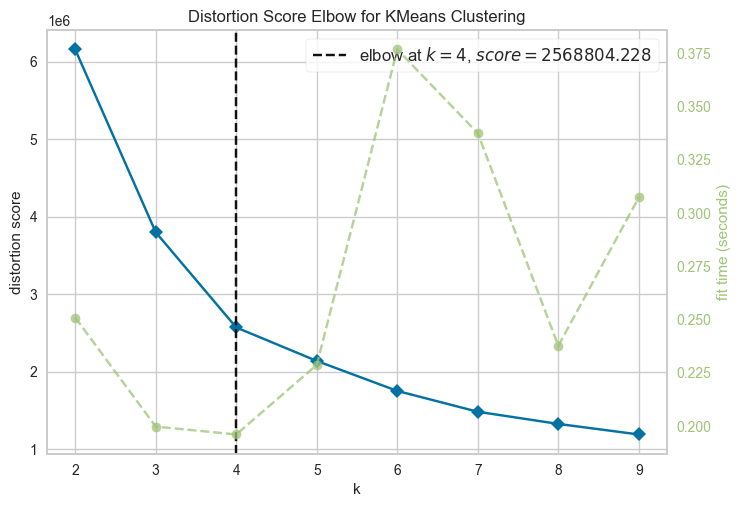

0.4393064994602282


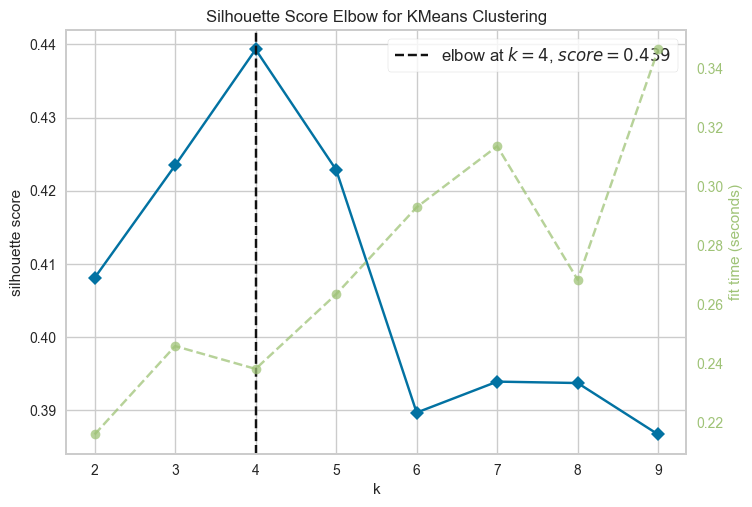

In [34]:
metrics = ['distortion', 'silhouette']
for metric in metrics:
    km = KMeans(random_state=0, n_init=10)
    visualizer = KElbowVisualizer(km, k=(2,10), metric=metric)
    visualizer.fit(X)
    print(visualizer.elbow_score_)
    visualizer.show() 

#### **Silhouette Score**

In [35]:
for i in range(2, 10):
    kmeans = KMeans(n_clusters=i, random_state=0, n_init=10)
    visualizer = SilhouetteVisualizer(kmeans)
    visualizer.fit(X)
    print(f"{i} clusters = {visualizer.silhouette_score_}")
plt.close()

2 clusters = 0.4080953980556161
3 clusters = 0.4234587535801153
4 clusters = 0.4393064994602282
5 clusters = 0.4228668183588165
6 clusters = 0.38969136744961586
7 clusters = 0.39392390279263206
8 clusters = 0.39373167694769684
9 clusters = 0.3867026792213703


#### **Dendogram**

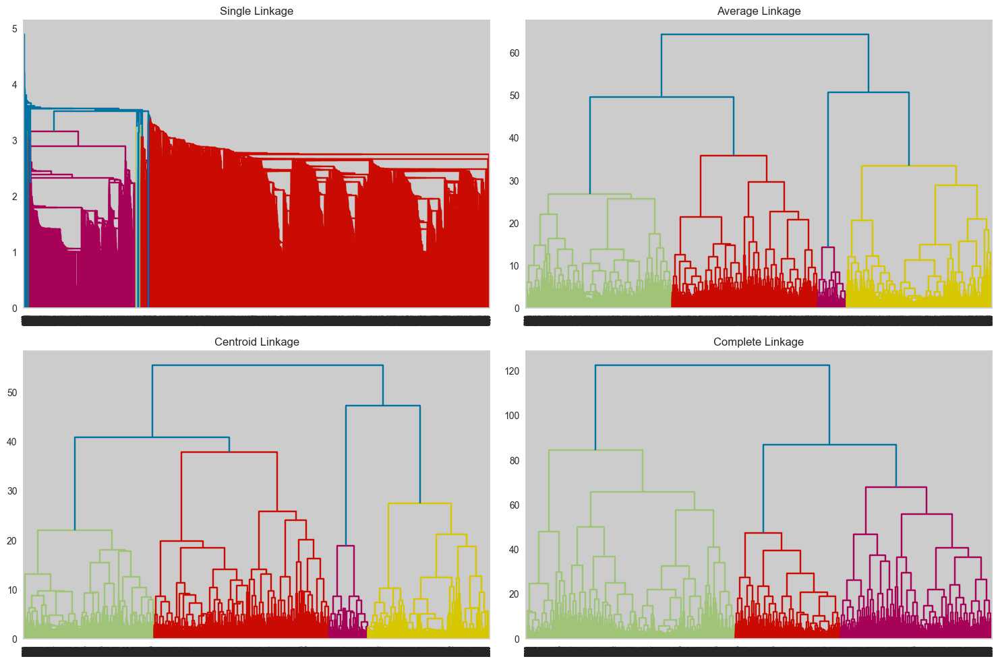

In [79]:
methods = ['single', 'average', 'centroid', 'complete']


fig, axes = plt.subplots(2, 2, figsize=(15, 10))
axes = axes.ravel()

for i, method in enumerate(methods):
    plt.sca(axes[i])
    plt.title(f"{method.capitalize()} Linkage")
    dend = shc.dendrogram(shc.linkage(df, method=method, metric='euclidean'))

plt.tight_layout()
plt.show()

#### **T-SNE**

In [36]:
df_tsne = pd.DataFrame(TSNE(n_components=2).fit_transform(X))

<Axes: xlabel='0', ylabel='1'>

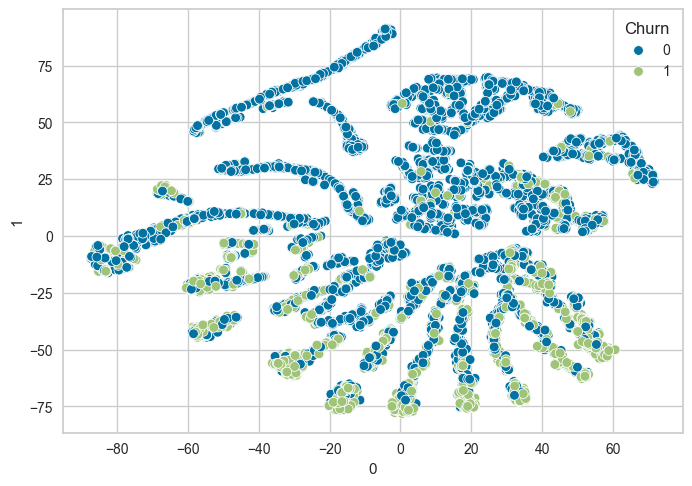

In [37]:
sns.scatterplot(df_tsne, x=0, y=1, hue=y)

### **Evaluation Methods**
1. **T-SNE**
2. **Silhouette Score**

### **1. KMeans**

In [23]:
kmeans = KMeans(n_clusters=4, n_init=10)
kmeans.fit(X)
labels = kmeans.labels_

In [24]:
pd.Series(labels).value_counts()

3    2186
1    1959
0    1745
2    1153
Name: count, dtype: int64

In [25]:
silhouette_score(X, labels)

0.4657094101182724

In [27]:
silhouette = silhouette_score(X, kmeans.labels_) 
db_index = davies_bouldin_score(X, kmeans.labels_) 
ch_index = calinski_harabasz_score(X, kmeans.labels_) 
ari = adjusted_rand_score(y, kmeans.labels_) 
mi = mutual_info_score(y, kmeans.labels_)
print(f"Silhouette Score: {silhouette:.3f}") 
print(f"Davies-Bouldin Index: {db_index:.3f}") 
print(f"Calinski-Harabasz Index: {ch_index:.3f}") 
print(f"Adjusted Rand Index: {ari:.3f}") 
print(f"Mutual Information (MI): {mi:.3f}")

Silhouette Score: 0.466
Davies-Bouldin Index: 0.755
Calinski-Harabasz Index: 9127.183
Adjusted Rand Index: 0.029
Mutual Information (MI): 0.072


In [32]:
df_tsne = pd.DataFrame(TSNE(n_components=2).fit_transform(X))

<Axes: xlabel='0', ylabel='1'>

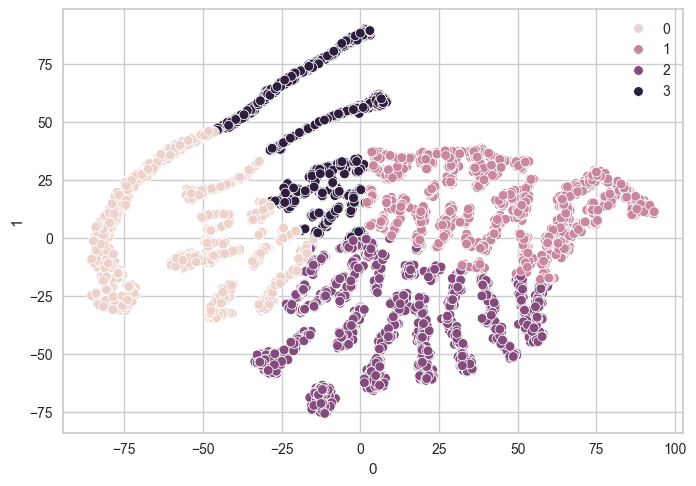

In [33]:
sns.scatterplot(df_tsne, x=0, y=1, hue=labels)

**Note**
- I will return to the preprocessing step to handle the **skewness**, for sure it will inhance the structure of sepreable classes.

In [55]:
df_log = df.copy()
df_sqrt = df.copy()
df_sq = df.copy()
df_cbrt = df.copy()
df_reciprocal = df.copy()
df_boxcox = df.copy()

In [56]:
df_log.TotalCharges = np.log(df_log.TotalCharges + 1)
df_log.MonthlyCharges = np.log(df_log.MonthlyCharges + 1)
df_log.tenure = np.log(df_log.tenure + 1)
df_log.Contract = np.log(df_log.Contract + 1)

df_sqrt.TotalCharges = np.sqrt(df_sqrt.TotalCharges)
df_sqrt.MonthlyCharges = np.sqrt(df_sqrt.MonthlyCharges)
df_sqrt.tenure = np.sqrt(df_sqrt.tenure)
df_sqrt.Contract = np.sqrt(df_sqrt.Contract)

df_sq.TotalCharges = df_sq.TotalCharges ** 2
df_sq.MonthlyCharges = df_sq.MonthlyCharges ** 2
df_sq.tenure = df_sq.tenure ** 2
df_sq.Contract = df_sq.Contract ** 2

df_cbrt.TotalCharges = np.cbrt(df_cbrt.TotalCharges)
df_cbrt.MonthlyCharges = np.cbrt(df_cbrt.MonthlyCharges)
df_cbrt.tenure = np.cbrt(df_log.tenure)
df_cbrt.Contract = np.cbrt(df_log.Contract)

df_reciprocal.TotalCharges = 1 / (df_reciprocal.TotalCharges)
df_reciprocal.MonthlyCharges = 1 / (df_reciprocal.MonthlyCharges)
# df_reciprocal.tenure = 1 / df_reciprocal.tenure

df_boxcox.TotalCharges, _ = stats.boxcox(df_boxcox.TotalCharges)
df_boxcox.MonthlyCharges, _ = stats.boxcox(df_boxcox.MonthlyCharges)
df_boxcox.Contract, _ = stats.boxcox(df_boxcox.Contract)

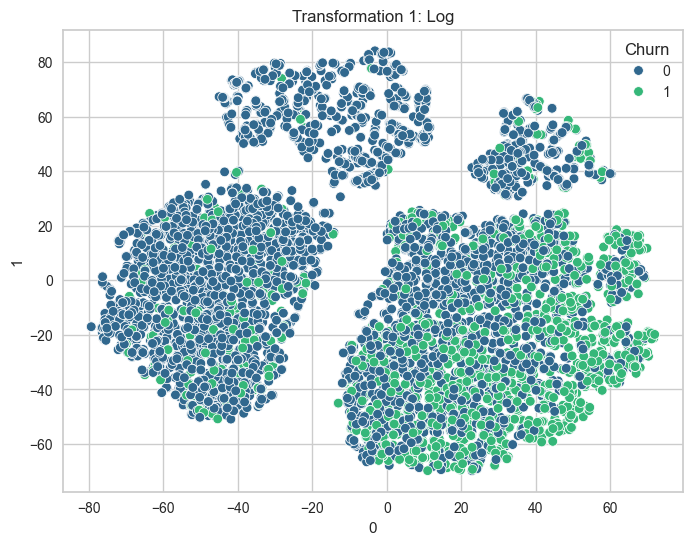

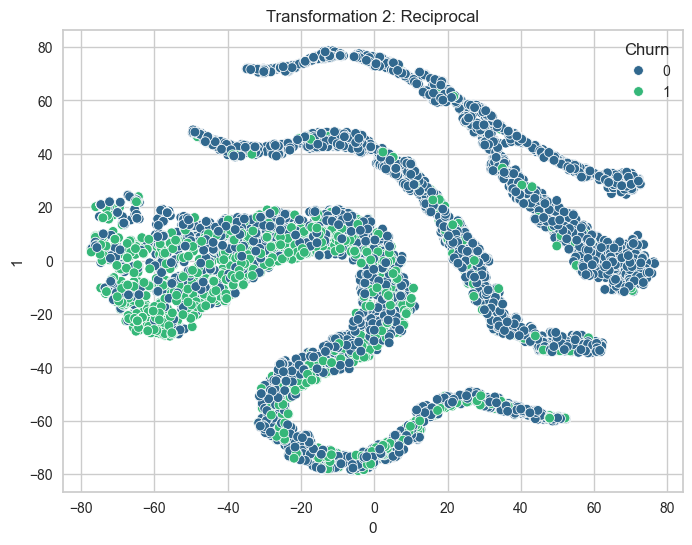

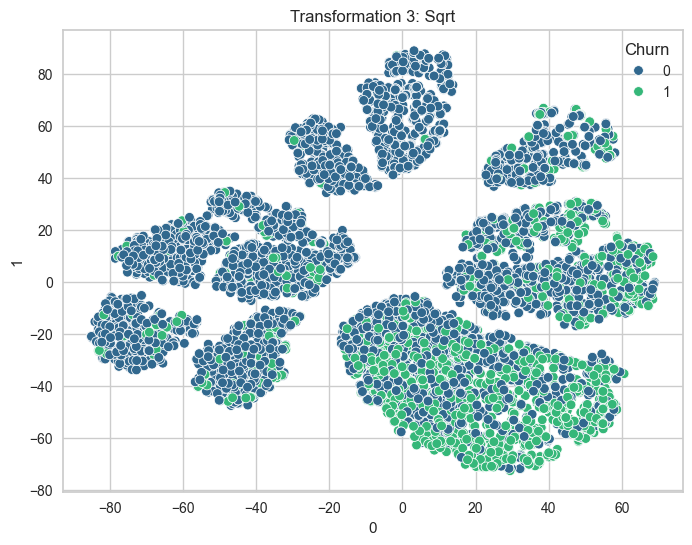

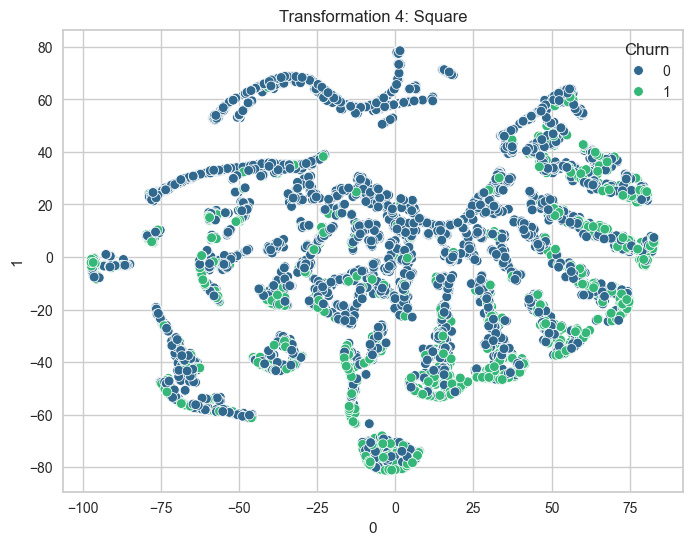

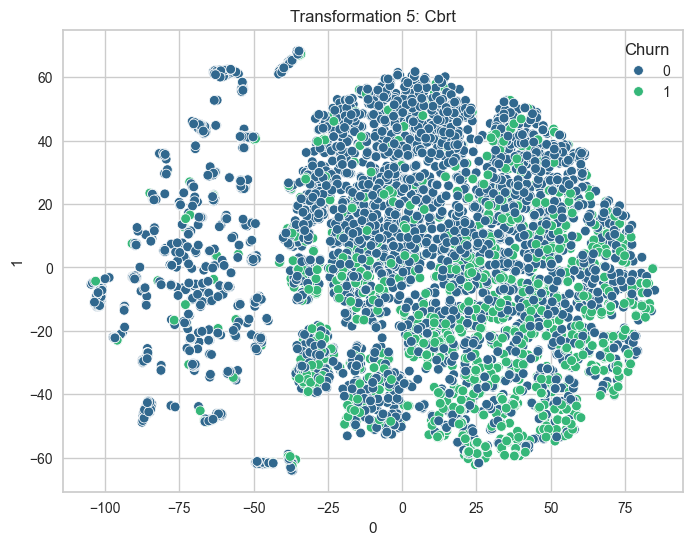

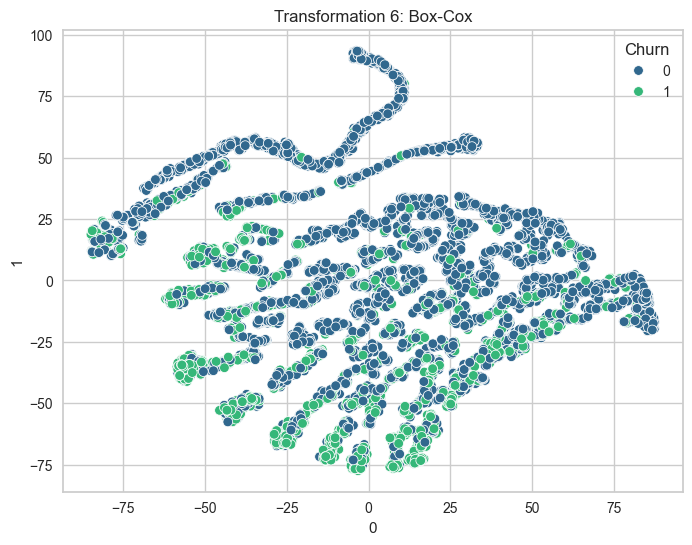

In [57]:
for i, df_ in enumerate([df_log, df_reciprocal, df_sqrt, df_sq, df_cbrt, df_boxcox]):
    features = df_.drop(columns=["Churn"])
    # kmeans = KMeans(n_clusters=4, n_init=10, init='k-means++')
    # kmeans.fit(features)
    # labels = kmeans.labels_
    tsne = pd.DataFrame(TSNE(n_components=2).fit_transform(features))
    
    plt.figure(figsize=(8, 6))
    sns.scatterplot(data=tsne, x=0, y=1, hue=y, palette="viridis")
    plt.title(f'Transformation {i + 1}: {["Log", "Reciprocal", "Sqrt", "Square", "Cbrt", "Box-Cox"][i]}')
    plt.show()

**Note**
- Some transformation techniques, for handling right skewed column, are with similar results which made the two classes more sepreable than before.
- But I will use Log or Sqrt Transformation because i have noticed that thier results are the better. 
- I can select Log.

In [59]:
df_transformed = df_log.copy()
X_new = df_transformed.drop(columns=["Churn"])

25503.16668727922


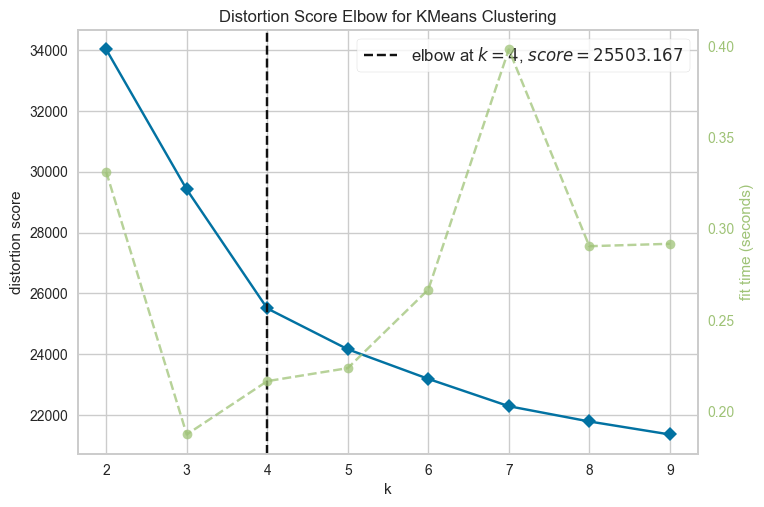

0.25164487381732636


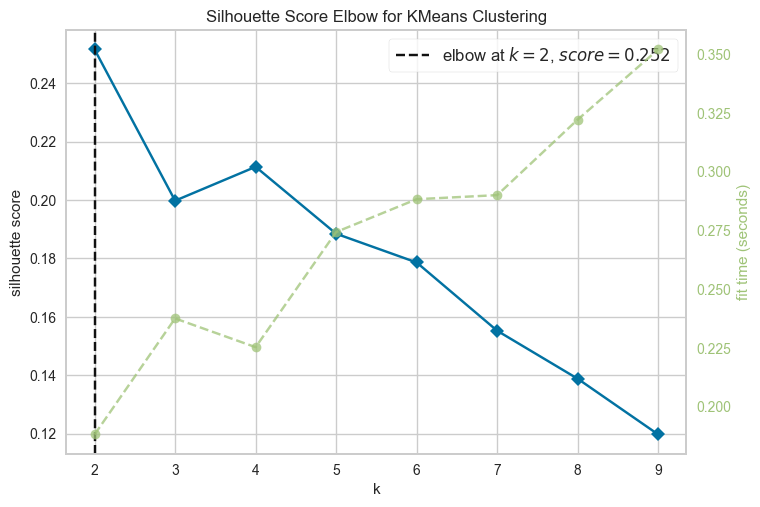

In [60]:
metrics = ['distortion', 'silhouette']
for metric in metrics:
    km = KMeans(random_state=0, n_init=10)
    visualizer = KElbowVisualizer(km, k=(2,10), metric=metric)
    visualizer.fit(X_new)
    print(visualizer.elbow_score_)
    visualizer.show() 

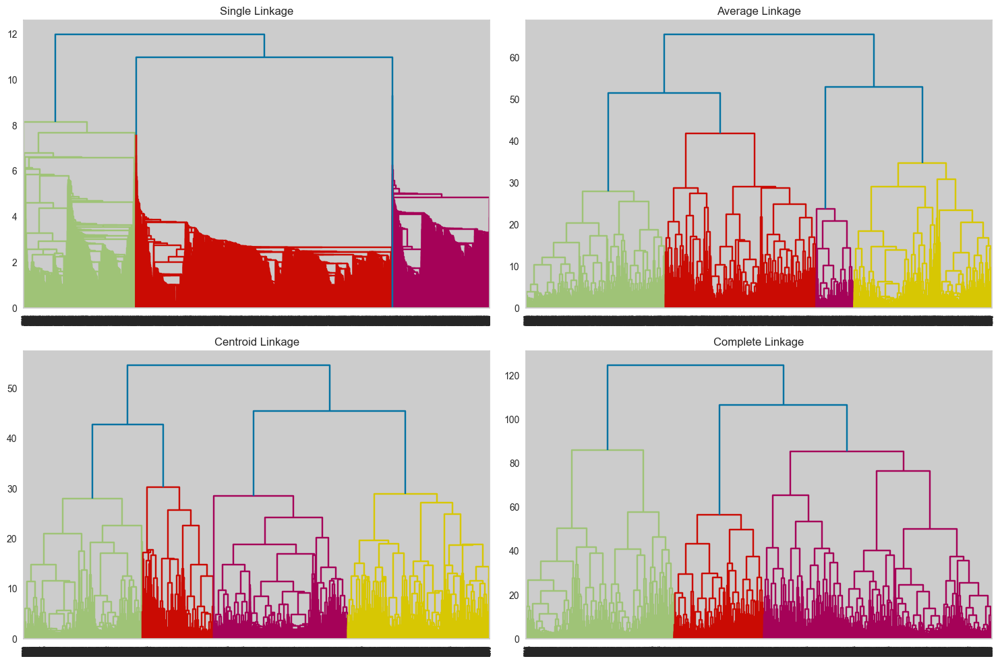

In [61]:
methods = ['single', 'average', 'centroid', 'complete']


fig, axes = plt.subplots(2, 2, figsize=(15, 10))
axes = axes.ravel()

for i, method in enumerate(methods):
    plt.sca(axes[i])
    plt.title(f"{method.capitalize()} Linkage")
    dend = shc.dendrogram(shc.linkage(df, method=method, metric='euclidean'))

plt.tight_layout()
plt.show()

In [71]:
kmeans = KMeans(n_clusters=2, n_init=10).fit(X_new)

In [72]:
silhouette_score(X_new, labels)

0.19980746934246219

<Axes: xlabel='0', ylabel='1'>

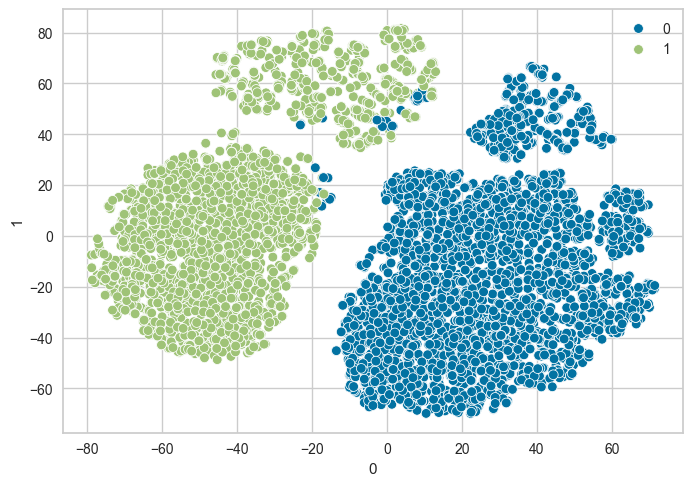

In [73]:
df_tsne = pd.DataFrame(TSNE(n_components=2).fit_transform(X_new))
sns.scatterplot(df_tsne, x=0, y=1, hue=kmeans.labels_)

**Note**
- Although silhouette_score was more better before the transformation (0.46 -> 0.14). But It doesn't mean that there is a problem in transformation.
- Maybe the problem is because of KMeans not the transformation, So i should try the following two solutions:
    - Hyperparameter Tuning.
    - Other Clustering Algorithms.

#### **Hyperparameter Tuning**

In [74]:
def objective(trial):
    n_init = trial.suggest_int('n_init', 10, 100)
    max_iter = trial.suggest_int('max_iter', 100, 1000)
    init = trial.suggest_categorical('init', ['k-means++', 'random'])


    model = KMeans(n_clusters=2, init=init, max_iter=max_iter, random_state=42, n_init=n_init)
    model.fit(X_new)
    labels = model.labels_
    

    score = silhouette_score(X_new, labels)
    return - score

study = optuna.create_study(direction='minimize')
study.optimize(objective, n_trials=50)

print(f"Best Parameters: {study.best_params}")
print(f"Best Score: {-study.best_value}")

[I 2024-09-22 01:59:44,182] A new study created in memory with name: no-name-71314cfa-2f01-414a-8fe8-de2684b8a05d
[I 2024-09-22 01:59:45,727] Trial 0 finished with value: -0.25164487381732636 and parameters: {'n_init': 43, 'max_iter': 870, 'init': 'k-means++'}. Best is trial 0 with value: -0.25164487381732636.
[I 2024-09-22 01:59:47,006] Trial 1 finished with value: -0.25164487381732636 and parameters: {'n_init': 21, 'max_iter': 573, 'init': 'k-means++'}. Best is trial 0 with value: -0.25164487381732636.
[I 2024-09-22 01:59:48,938] Trial 2 finished with value: -0.25164487381732636 and parameters: {'n_init': 62, 'max_iter': 172, 'init': 'random'}. Best is trial 0 with value: -0.25164487381732636.
[I 2024-09-22 01:59:52,218] Trial 3 finished with value: -0.25164487381732636 and parameters: {'n_init': 92, 'max_iter': 917, 'init': 'random'}. Best is trial 0 with value: -0.25164487381732636.
[I 2024-09-22 01:59:54,859] Trial 4 finished with value: -0.25164487381732636 and parameters: {'n_in

Best Parameters: {'n_init': 43, 'max_iter': 870, 'init': 'k-means++'}
Best Score: 0.25164487381732636


#### **KMeans (Final Results)**

In [167]:
kmeans = KMeans(n_clusters=2, n_init=43, max_iter=870, init='k-means++')
kmeans.fit(X_new)
kmeans_labels = kmeans.labels_
silhouette_score(X_new, kmeans_labels)

0.25164487381732636

<Axes: xlabel='0', ylabel='1'>

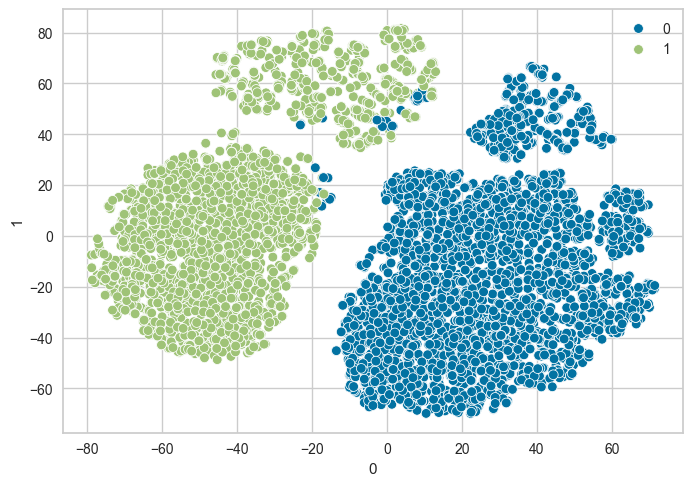

In [168]:
sns.scatterplot(df_tsne, x=0, y=1, hue=kmeans_labels)

**Note**
- I will try another algorithms that maybe more powerful than Kmeans.

### **2. Hierarchial Clustering**

In [77]:
hierarch = AgglomerativeClustering(n_clusters=2).fit(X_new)

In [78]:
silhouette_score(X_new, hierarch.labels_)

0.2509377701249395

<Axes: xlabel='0', ylabel='1'>

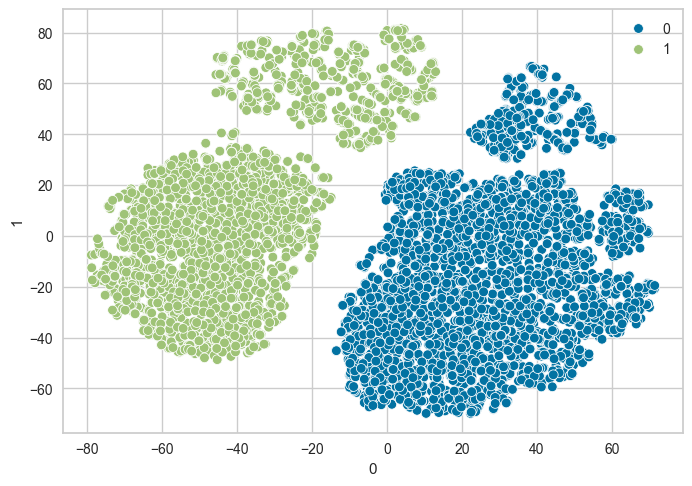

In [79]:
sns.scatterplot(df_tsne, x=0, y=1, hue=hierarch.labels_)

#### **Hyperparameter Tuning**

In [80]:
def objective(trial):

    metric = trial.suggest_categorical('metric', ['euclidean', 'manhattan', 'cosine'])
    linkage = trial.suggest_categorical('linkage', ['ward', 'complete', 'average', 'single'])
    
    if linkage == 'ward' and metric != 'euclidean':
        return float('inf')

    model = AgglomerativeClustering(n_clusters=2, metric=metric, linkage=linkage)

    model.fit(X_new)

    score = silhouette_score(X_new, model.labels_)
    return - score

study = optuna.create_study(direction='minimize')
study.optimize(objective, n_trials=50)

print(f"Best Parameters: {study.best_params}")
print(f"Best Score: {- study.best_value}")

[I 2024-09-22 02:02:06,514] A new study created in memory with name: no-name-45137524-2e95-439c-bcae-b4f193f2d4d1
[I 2024-09-22 02:02:06,518] Trial 0 finished with value: inf and parameters: {'metric': 'cosine', 'linkage': 'ward'}. Best is trial 0 with value: inf.
[I 2024-09-22 02:02:09,106] Trial 1 finished with value: -0.2509377701249395 and parameters: {'metric': 'euclidean', 'linkage': 'ward'}. Best is trial 1 with value: -0.2509377701249395.
[I 2024-09-22 02:02:11,921] Trial 2 finished with value: -0.1760847128691377 and parameters: {'metric': 'cosine', 'linkage': 'average'}. Best is trial 1 with value: -0.2509377701249395.
[I 2024-09-22 02:02:14,404] Trial 3 finished with value: -0.1386682187485549 and parameters: {'metric': 'manhattan', 'linkage': 'complete'}. Best is trial 1 with value: -0.2509377701249395.
[I 2024-09-22 02:02:16,888] Trial 4 finished with value: -0.11204699217894404 and parameters: {'metric': 'cosine', 'linkage': 'complete'}. Best is trial 1 with value: -0.250

Best Parameters: {'metric': 'euclidean', 'linkage': 'ward'}
Best Score: 0.2509377701249395


#### **Hierarchial Clustering (Final Results)**

In [84]:
hierarch = AgglomerativeClustering(n_clusters=2, linkage='ward', metric='euclidean').fit(X_new)

In [85]:
silhouette_score(X_new, hierarch.labels_)

0.2509377701249395

<Axes: xlabel='0', ylabel='1'>

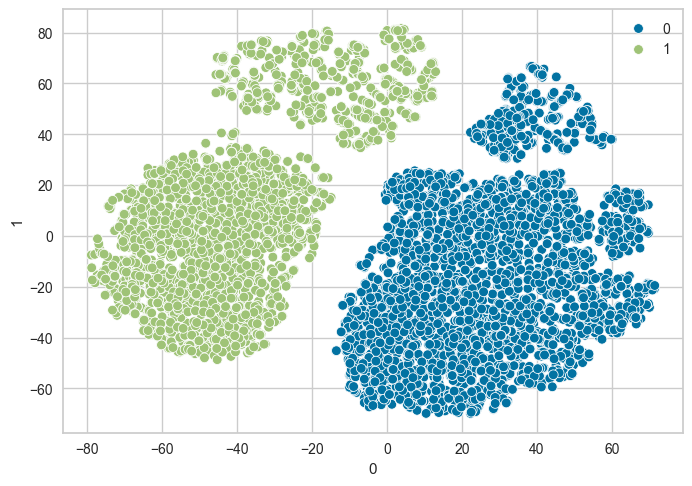

In [86]:
sns.scatterplot(df_tsne, x=0, y=1, hue=hierarch.labels_)

**Note**
- It's better than kmeans result, but still i will try another algorithms.

### **3. DBSCAN**

In [87]:
dbscan = DBSCAN(eps=0.5, min_samples=5).fit(X_new)

In [88]:
silhouette_score(X_new, dbscan.labels_)

-0.28066810133399167

<Axes: xlabel='0', ylabel='1'>

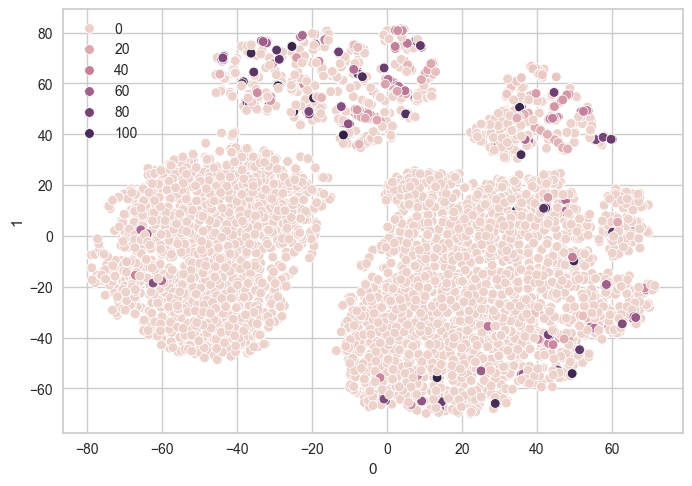

In [89]:
sns.scatterplot(df_tsne, x=0, y=1, hue=dbscan.labels_)

#### **Hyperparameter Tuning**

1. Choose min_samples:
    - A good starting point is using min_samples = D + 1, where D is the number of features (dimensions) in your dataset.
    - For datasets with noise or with some noise tolerance, increasing min_samples can help reduce noise sensitivity.

2. Choosing eps:
    - One common method for selecting eps is the k-distance graph:
        - Calculate the distance to the k-th nearest neighbor (usually k = min_samples - 1) for each point.
        - Plot the sorted k-distances.
        - Find the "elbow" or point of maximum curvature in this plot, which indicates the appropriate eps.

3. Visualize Clustering:
    - For lower-dimensional datasets, visually inspect the clusters formed by different eps values.
    - For higher-dimensional data, use dimensionality reduction techniques like PCA or t-SNE to visualize the clusters.


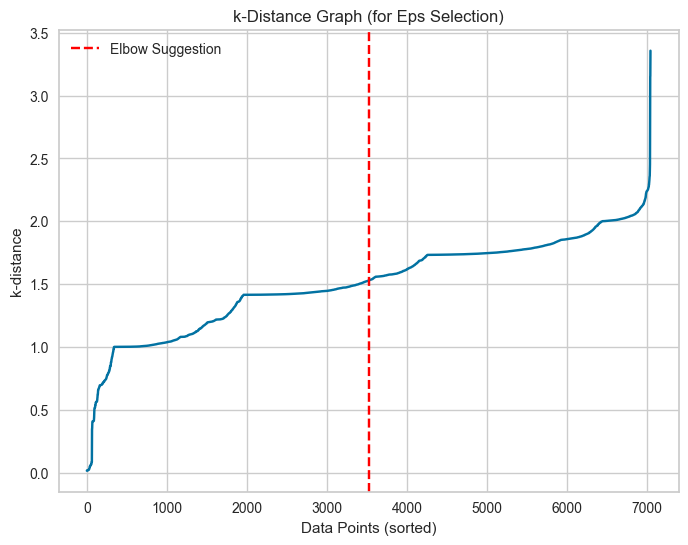

In [90]:
min_samples = 23
nbrs = NearestNeighbors(n_neighbors=min_samples).fit(X_new)
distances, indices = nbrs.kneighbors(X_new)

k_distances = np.sort(distances[:, -1])

plt.figure(figsize=(8, 6))
plt.plot(k_distances)
plt.axvline(x=len(k_distances) // 2, color='red', linestyle='--', label="Elbow Suggestion")
plt.title('k-Distance Graph (for Eps Selection)')
plt.xlabel('Data Points (sorted)')
plt.ylabel('k-distance')
plt.grid(True)
plt.legend()
plt.show()

#### **DBSCAN (Final Results)**

In [134]:
dbscan = DBSCAN(eps=1.87, min_samples=min_samples).fit(X_new)

In [135]:
silhouette_score(X_new, dbscan.labels_)

0.18381633350855703

In [136]:
## Removing the outliers to calculate the score
non_noise_mask = dbscan.labels_ != -1
non_noise_points = X_new[non_noise_mask]
non_noise_labels = dbscan.labels_[non_noise_mask]

silhouette_score(non_noise_points, non_noise_labels)

0.25290350103930115

In [137]:
from collections import Counter

a = dict(Counter(dbscan.labels_))
a

{0: 3858, 1: 3135, -1: 50}

<Axes: xlabel='0', ylabel='1'>

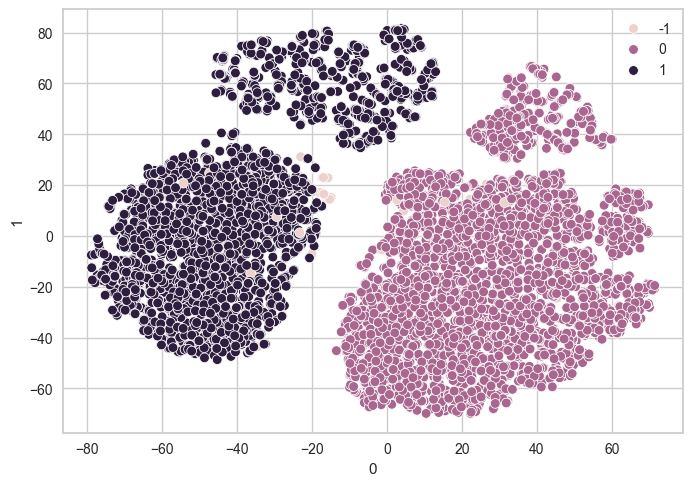

In [138]:
sns.scatterplot(df_tsne, x=0, y=1, hue=dbscan.labels_)

**Note**
- It's the best eps (1.87) and min_points with me untill now but there are some of outliers (50).
- For sure, I will try another algorithms.

### **4. GaussianMixture (GMM)**

In [139]:
gm = GaussianMixture(init_params='kmeans', n_components=2, random_state=42)
labels = gm.fit_predict(X_new)

In [140]:
silhouette_score(X_new, labels)

0.2509377701249395

<Axes: xlabel='0', ylabel='1'>

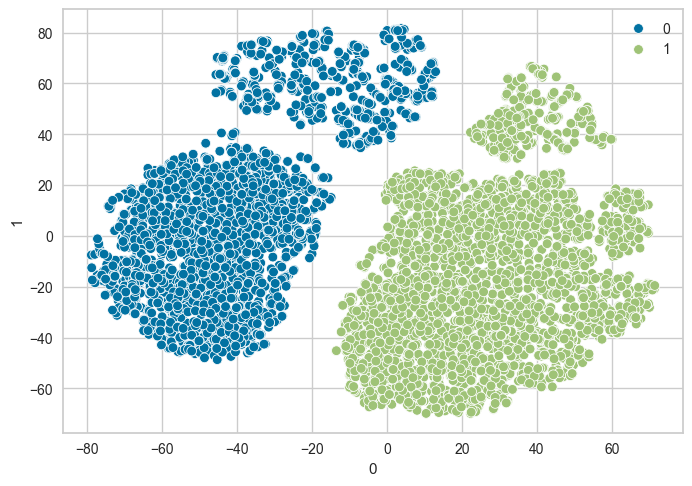

In [141]:
sns.scatterplot(df_tsne, x=0, y=1, hue=labels)

**Note**
- Its result is similar to Hierarchial Clustering
- It sepreted the data perfectly but I will apply some of hyperparamter tuning if there is further enhancement and specially for future points(Customers).

In [142]:
def objective(trial):
    covariance_type = trial.suggest_categorical('covariance_type', ['full', 'tied', 'diag', 'spherical'])
    init_params = trial.suggest_categorical('init_params', ['kmeans'])

    gmm = GaussianMixture(n_components=2, covariance_type=covariance_type, init_params=init_params, random_state=42)
    labels = gmm.fit_predict(X_new)

    try:
        score = silhouette_score(X_new, labels)
    except ValueError:
        score = 1.0
    
    return -score

study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=50)

print(f"Best Parameters: {study.best_params}")
print(f"Best Score: {-study.best_value}")

[I 2024-09-22 02:23:39,196] A new study created in memory with name: no-name-5ef50582-9121-4913-81ec-90e1f7964db0
[I 2024-09-22 02:23:40,368] Trial 0 finished with value: -0.2515162416315771 and parameters: {'covariance_type': 'spherical', 'init_params': 'kmeans'}. Best is trial 0 with value: -0.2515162416315771.
[I 2024-09-22 02:23:41,576] Trial 1 finished with value: -0.2509377701249395 and parameters: {'covariance_type': 'diag', 'init_params': 'kmeans'}. Best is trial 1 with value: -0.2509377701249395.
[I 2024-09-22 02:23:42,872] Trial 2 finished with value: -0.2515162416315771 and parameters: {'covariance_type': 'spherical', 'init_params': 'kmeans'}. Best is trial 1 with value: -0.2509377701249395.
[I 2024-09-22 02:23:44,073] Trial 3 finished with value: -0.2509377701249395 and parameters: {'covariance_type': 'full', 'init_params': 'kmeans'}. Best is trial 1 with value: -0.2509377701249395.
[I 2024-09-22 02:23:45,351] Trial 4 finished with value: -0.2515162416315771 and parameters:

Best Parameters: {'covariance_type': 'diag', 'init_params': 'kmeans'}
Best Score: 0.2509377701249395


#### **Gaussian Mixture (Final Results)**

In [143]:
gm = GaussianMixture(init_params='kmeans', n_components=2, random_state=42, covariance_type='diag')
gm_labels = gm.fit_predict(X_new)

In [144]:
silhouette_score(X_new, labels)

0.2509377701249395

<Axes: xlabel='0', ylabel='1'>

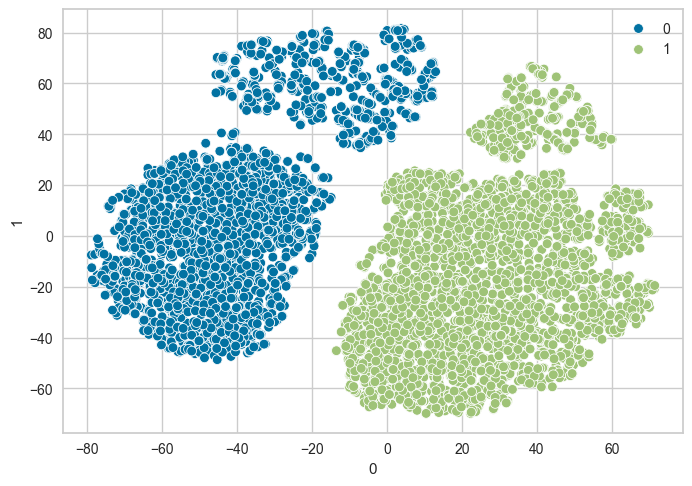

In [145]:
sns.scatterplot(df_tsne, x=0, y=1, hue=gm_labels)

**Note**
- GMM Result is somewhat similar to the result of the Hierarchial Clustering.
- I will search for more algorithms.

### **5. Isolation Forest**

In [146]:
irf = IsolationForest(random_state=0)
labels = irf.fit_predict(X_new)

<Axes: xlabel='0', ylabel='1'>

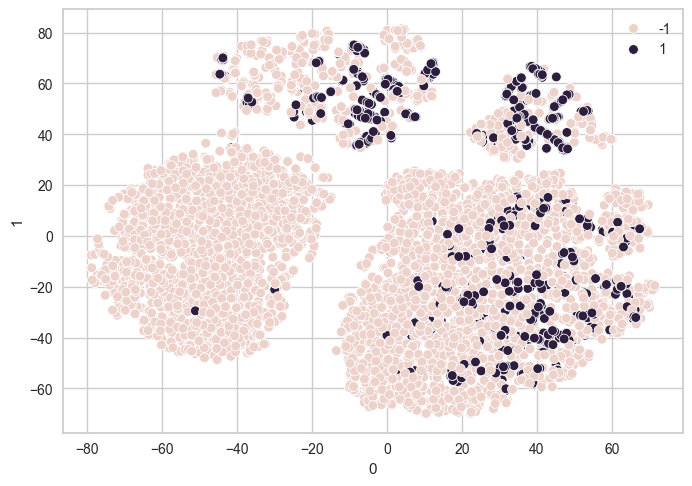

In [147]:
sns.scatterplot(df_tsne, x=0, y=1, hue=labels)

In [163]:
def objective(trial):

    n_estimators = trial.suggest_int('n_estimators', 50, 500)
    max_samples = trial.suggest_int('max_samples', 50, X_new.shape[0])
    max_features = trial.suggest_int('max_features', 1, X_new.shape[1])
    
    iso_forest = IsolationForest(n_estimators=n_estimators, max_samples=max_samples, max_features=max_features, random_state=42)
    labels = iso_forest.fit_predict(X_new)
    
    try:
        silhouette_avg = silhouette_score(X_new, labels)
    except ValueError:
        silhouette_avg = -1.0

    return silhouette_avg

study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=50)

print(f"Best Parameters: {study.best_params}")
print(f"Best Score: {study.best_value}")

[I 2024-09-22 02:31:04,621] A new study created in memory with name: no-name-7d401034-fd63-43e8-870e-1f28349e16c9
[I 2024-09-22 02:31:06,360] Trial 0 finished with value: 0.01777392606106779 and parameters: {'n_estimators': 164, 'max_samples': 3560, 'max_features': 5}. Best is trial 0 with value: 0.01777392606106779.
[I 2024-09-22 02:31:10,160] Trial 1 finished with value: 0.03784824653601768 and parameters: {'n_estimators': 311, 'max_samples': 6932, 'max_features': 20}. Best is trial 1 with value: 0.03784824653601768.
[I 2024-09-22 02:31:12,033] Trial 2 finished with value: 0.03338580427473701 and parameters: {'n_estimators': 221, 'max_samples': 1053, 'max_features': 12}. Best is trial 1 with value: 0.03784824653601768.
[I 2024-09-22 02:31:16,516] Trial 3 finished with value: 0.036038981412716026 and parameters: {'n_estimators': 451, 'max_samples': 5452, 'max_features': 18}. Best is trial 1 with value: 0.03784824653601768.
[I 2024-09-22 02:31:18,151] Trial 4 finished with value: 0.005

Best Parameters: {'n_estimators': 51, 'max_samples': 3592, 'max_features': 20}
Best Score: 0.043377815667086414


#### **Isolation Forest (Final Results)**

In [164]:
irf = IsolationForest(n_estimators=51, max_samples=3592, max_features=20, random_state=0)
labels = irf.fit_predict(X_new)

<Axes: xlabel='0', ylabel='1'>

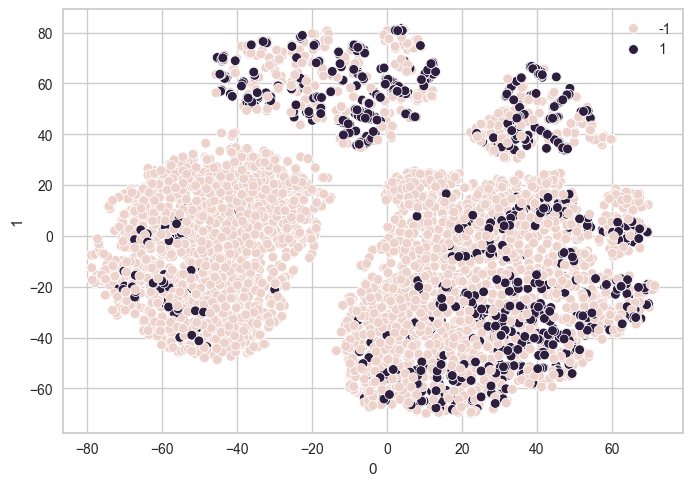

In [165]:
sns.scatterplot(df_tsne, x=0, y=1, hue=labels)

**Note**
- Its result is still approximately similar as before, And all previous algorithms are better.

### **Final Results**
- GMM and Hierarchial Clustering are the best ones, then DBSCAN and KMeans.
- So I will use GMM to extract the insights and the information of each cluster.
- To do so (extract the insights), I will plot the percentage of customers in each cluster for each feature.
- So, for example, If the percentage of customers of specific feature is high in cluster and low in the other. It means that this feature describe the cluster more clearly, So easily I can depend on this feature to differenciate the current or new customer belongs to which cluster.

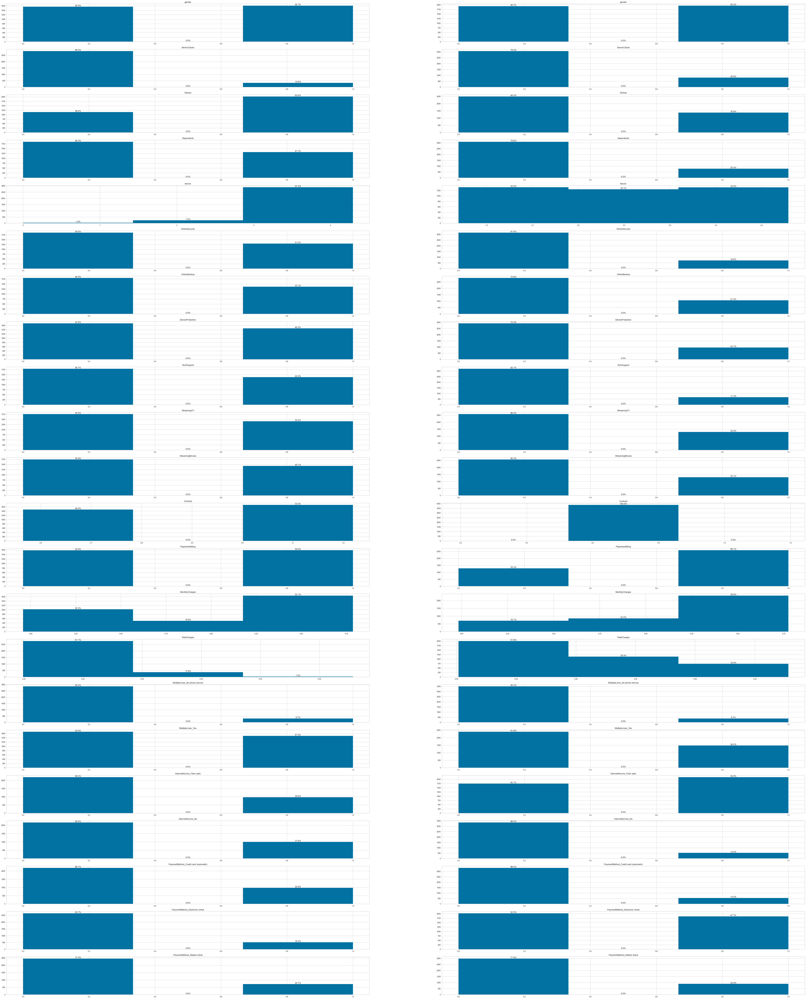

In [166]:
num_features = len(X.columns)
fig, ax = plt.subplots(num_features, 2, figsize=(80, 100))

for column in X.columns:    
    feature_index = X.columns.get_loc(column)
    
    for label in range(2):    
        ax[feature_index, label].hist(df_log[column][np.where(gm_labels == label)[0]], bins=3)
        
        counts, bins = np.histogram(df_log[column][np.where(gm_labels == label)[0]], bins=3)
        percentages = [(count / len(df_log[column][np.where(gm_labels == label)[0]])) * 100 for count in counts]

        for i in range(len(bins) - 1):
            bin_center = (bins[i] + bins[i + 1]) / 2
            ax[feature_index, label].text(bin_center, counts[i], f'{percentages[i]:.1f}%', ha='center', va='bottom')

        ax[feature_index, label].title.set_text(column)

### **Our Insights**

**First Cluster**

- First Cluster includes customers with high tenure.
- First Cluster uses almost all services provided by telecom company.
- First Cluster has a high percentage of customers that use paperless billing.
- First Cluster includes customers with very high amount charged monthly.
- First Cluster uses multiple lines.
- First Cluster includes many customers 2-year contract.
- First Cluster use automatic check in payment more.

**Second Cluster**
- Second Cluster includes customers with low tenure compared to first cluster.
- Second Cluster uses the services slightly.
- Second Cluster has a low percentage of customers that use paperless billing.
- Second Cluster includes customers with low or moderate amount charged monthly.
- Second Cluster doesn't use multiple lines.
- Second Cluster nearly doesn't include customers 2-year contract.
- Second Cluster use electronic check more.

### **From Previous Insights**

- It's expected that the second cluster is the likely to churn cluster and the first cluster will not churn, Because:
    - First Cluster
        - high tenure.
        - charges monthly with a high amount and have multiple lines that it means they are satisfied about the provided telecom service.
        - uses all company services that it means they are very engaged and comfortable with using the system.
        - adopt the 2-year contract.

    - Second Cluster
        - low tenure
        - doesn't charge monthly with high amounts.
        - doesn't use the multiple lines.
        - doesn't adopt the long time contracts.

### **Solutions For Retention**

1. Make discounts for first cluster because they charge monthly with high amounts.
2. Make gifts (free sevices for period) for first cluster in year anniversery to strength their belonging and loyalty with the company.
2. Make an electronic adversements and offers for customers in second cluster.
3. Make offers for second cluster customers on using or connecting addition or new phone lines.

## **Another Clustering Approach**
- I will use transformed data via Reciprocal Transformation to make the clustering because the resultant clusters from this transformation is also seperable.

In [172]:
df_transformed = df_reciprocal.copy()
X_reciprocal = df_transformed.drop(columns=["Churn"])

552685.5772542041


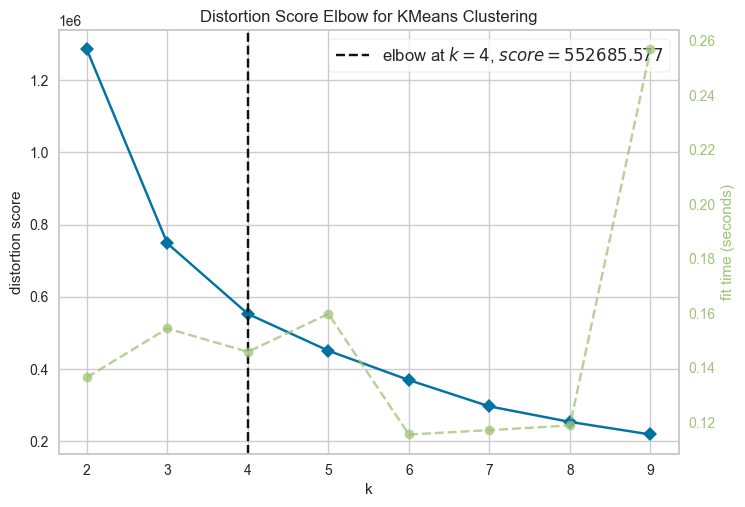

0.6135716059853917


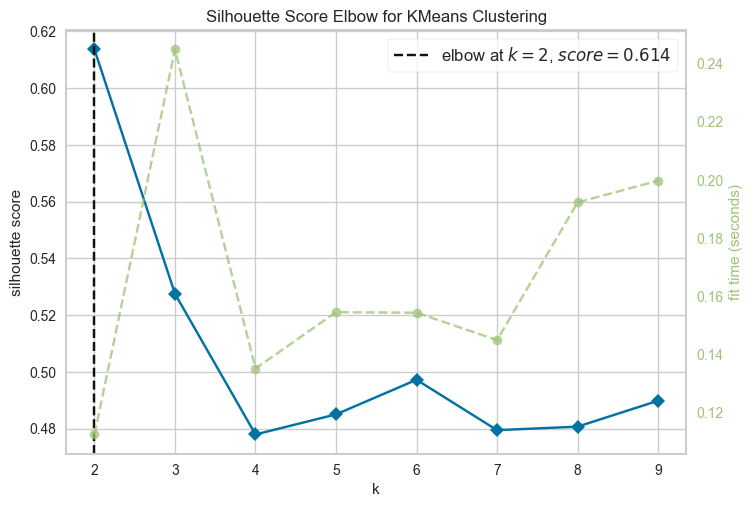

In [170]:
metrics = ['distortion', 'silhouette']
for metric in metrics:
    km = KMeans(random_state=0, n_init=10)
    visualizer = KElbowVisualizer(km, k=(2,10), metric=metric)
    visualizer.fit(X_reciprocal)
    print(visualizer.elbow_score_)
    visualizer.show() 

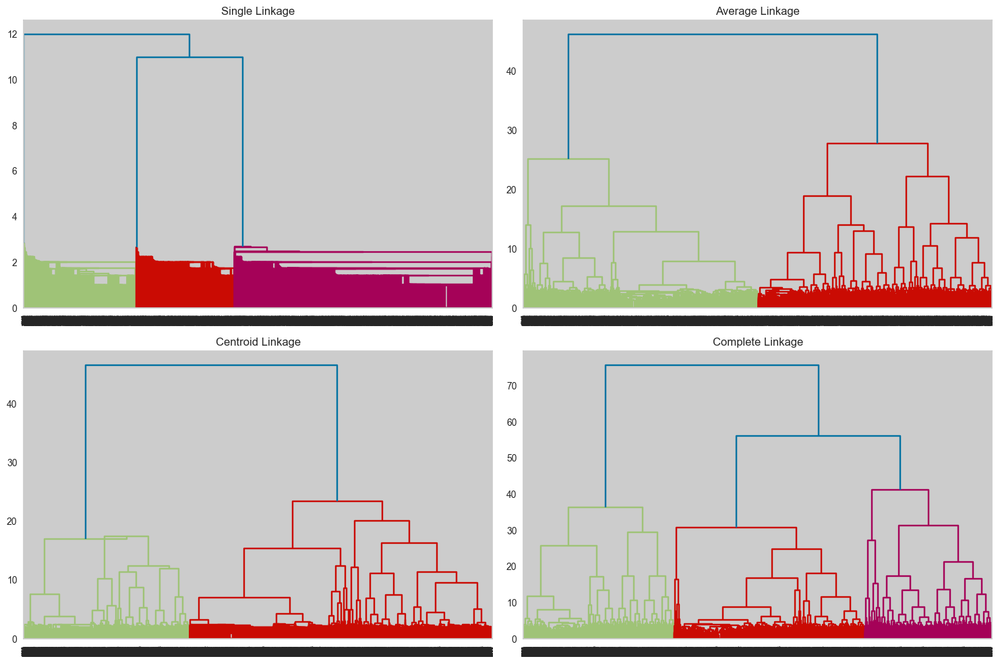

In [171]:
methods = ['single', 'average', 'centroid', 'complete']


fig, axes = plt.subplots(2, 2, figsize=(15, 10))
axes = axes.ravel()

for i, method in enumerate(methods):
    plt.sca(axes[i])
    plt.title(f"{method.capitalize()} Linkage")
    dend = shc.dendrogram(shc.linkage(X_reciprocal, method=method, metric='euclidean'))

plt.tight_layout()
plt.show()

<Axes: xlabel='0', ylabel='1'>

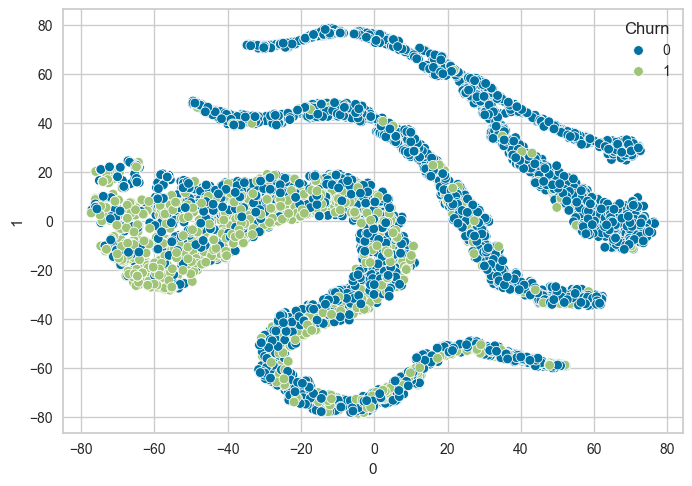

In [173]:
df_tsne = pd.DataFrame(TSNE(n_components=2).fit_transform(X_reciprocal))
sns.scatterplot(df_tsne, x=0, y=1, hue=y)

In [198]:
df_tsne = pd.DataFrame(TSNE(n_components=2).fit_transform(X_reciprocal))

**Note**
- From previous techniques:
   - Distortion (4) and Silhouette (2): **Average (3)**
   - Complete Dendogram
   - T-SNE
- I will select **(3)** as a number of cluster.

**Note**

- From the shape and structure of clusters, I think DBSCAN will be the model with the best clustering result.
- But i will try others in addition to DBSCAN.

### **1. BSCAN**

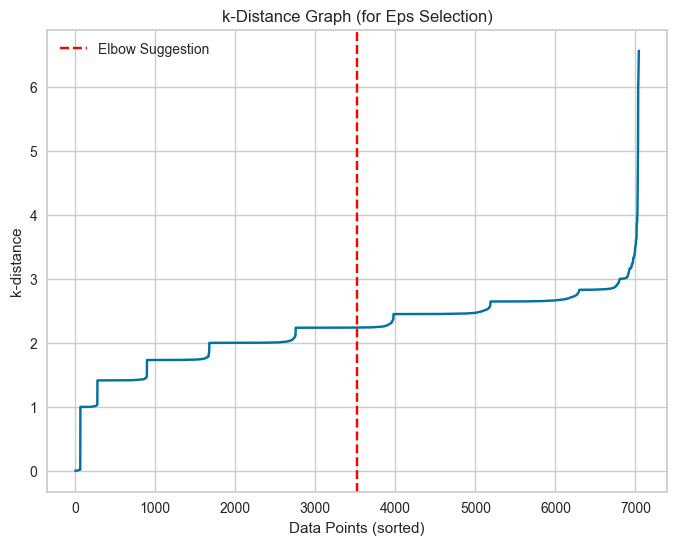

In [237]:
min_samples = 22
nbrs = NearestNeighbors(n_neighbors=min_samples).fit(X_reciprocal)
distances, indices = nbrs.kneighbors(X_reciprocal)

k_distances = np.sort(distances[:, -1])

plt.figure(figsize=(8, 6))
plt.plot(k_distances)
plt.axvline(x=len(k_distances) // 2, color='red', linestyle='--', label="Elbow Suggestion")
plt.title('k-Distance Graph (for Eps Selection)')
plt.xlabel('Data Points (sorted)')
plt.ylabel('k-distance')
plt.grid(True)
plt.legend()
plt.show()

In [327]:
dbscan = DBSCAN(eps=7, min_samples=23).fit(X_reciprocal)

In [328]:
from collections import Counter

a = dict(Counter(dbscan.labels_))
a

{0: 3875, 1: 1473, 2: 1695}

<Axes: xlabel='0', ylabel='1'>

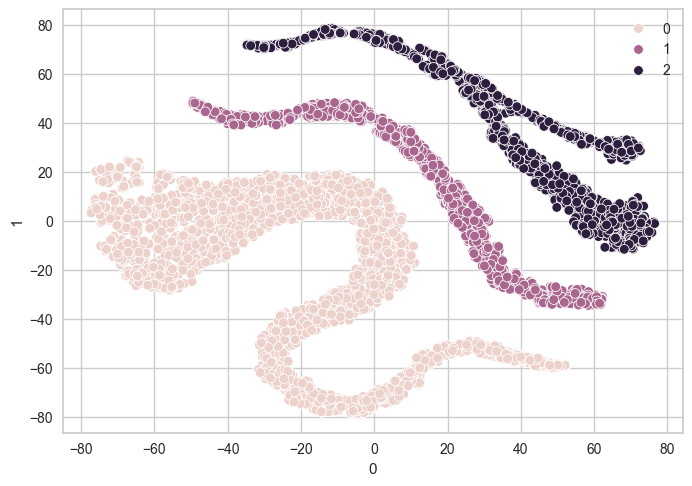

In [329]:
sns.scatterplot(df_tsne, x=0, y=1, hue=dbscan.labels_)

#### **Important Note**
- I tried different eps and found that eps = [4.2 : 11] seperates the datato three clusters perfectly without any outliers
- So, I will choose eps = 7 because it's the middle of range.

### **2. Hierarchial Clustering**

In [248]:
def objective(trial):

    metric = trial.suggest_categorical('metric', ['euclidean', 'manhattan', 'cosine'])
    linkage = trial.suggest_categorical('linkage', ['ward', 'complete', 'average', 'single'])
    
    if linkage == 'ward' and metric != 'euclidean':
        return float('inf')

    model = AgglomerativeClustering(n_clusters=3, metric=metric, linkage=linkage)

    model.fit(X_reciprocal)

    score = silhouette_score(X_reciprocal, model.labels_)
    return - score

study = optuna.create_study(direction='minimize')
study.optimize(objective, n_trials=50)

print(f"Best Parameters: {study.best_params}")
print(f"Best Score: {- study.best_value}")

[I 2024-09-22 03:51:49,613] A new study created in memory with name: no-name-2e421b90-5753-42ca-94c6-1866ba45b68d
[I 2024-09-22 03:51:53,117] Trial 0 finished with value: -0.06570978121203487 and parameters: {'metric': 'cosine', 'linkage': 'average'}. Best is trial 0 with value: -0.06570978121203487.
[I 2024-09-22 03:51:55,897] Trial 1 finished with value: -0.5220443646974556 and parameters: {'metric': 'euclidean', 'linkage': 'complete'}. Best is trial 1 with value: -0.5220443646974556.
[I 2024-09-22 03:51:55,901] Trial 2 finished with value: inf and parameters: {'metric': 'cosine', 'linkage': 'ward'}. Best is trial 1 with value: -0.5220443646974556.
[I 2024-09-22 03:51:55,903] Trial 3 finished with value: inf and parameters: {'metric': 'cosine', 'linkage': 'ward'}. Best is trial 1 with value: -0.5220443646974556.
[I 2024-09-22 03:51:59,020] Trial 4 finished with value: -0.06456884579784575 and parameters: {'metric': 'cosine', 'linkage': 'complete'}. Best is trial 1 with value: -0.5220

Best Parameters: {'metric': 'euclidean', 'linkage': 'complete'}
Best Score: 0.5220443646974556


In [330]:
hierarch = AgglomerativeClustering(n_clusters=3, linkage='complete', metric='euclidean').fit(X_reciprocal)

<Axes: xlabel='0', ylabel='1'>

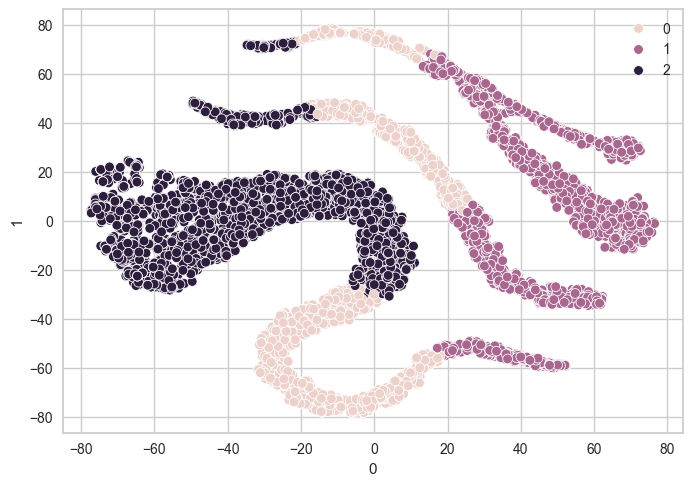

In [331]:
sns.scatterplot(df_tsne, x=0, y=1, hue=hierarch.labels_)

### **3. GMM**

In [194]:
def objective(trial):
    covariance_type = trial.suggest_categorical('covariance_type', ['full', 'tied', 'diag', 'spherical'])
    init_params = trial.suggest_categorical('init_params', ['kmeans'])

    gmm = GaussianMixture(n_components=3, covariance_type=covariance_type, init_params=init_params, random_state=42)
    labels = gmm.fit_predict(X_reciprocal)

    try:
        score = silhouette_score(X_reciprocal, labels)
    except ValueError:
        score = 1.0
    
    return -score

study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=50)

print(f"Best Parameters: {study.best_params}")
print(f"Best Score: {-study.best_value}")

[I 2024-09-22 03:28:54,697] A new study created in memory with name: no-name-37f8225b-2c91-434f-88f5-3166c8258a55
[I 2024-09-22 03:28:55,741] Trial 0 finished with value: -0.47017123471654415 and parameters: {'covariance_type': 'spherical', 'init_params': 'kmeans'}. Best is trial 0 with value: -0.47017123471654415.
[I 2024-09-22 03:28:56,846] Trial 1 finished with value: -0.47017123471654415 and parameters: {'covariance_type': 'spherical', 'init_params': 'kmeans'}. Best is trial 0 with value: -0.47017123471654415.
[I 2024-09-22 03:28:57,902] Trial 2 finished with value: -0.47017123471654415 and parameters: {'covariance_type': 'spherical', 'init_params': 'kmeans'}. Best is trial 0 with value: -0.47017123471654415.
[I 2024-09-22 03:28:59,700] Trial 3 finished with value: -0.4414886398838573 and parameters: {'covariance_type': 'full', 'init_params': 'kmeans'}. Best is trial 3 with value: -0.4414886398838573.
[I 2024-09-22 03:29:01,295] Trial 4 finished with value: -0.4414886398838573 and 

Best Parameters: {'covariance_type': 'diag', 'init_params': 'kmeans'}
Best Score: 0.09783396967149331


In [333]:
gm = GaussianMixture(init_params='kmeans', n_components=3, random_state=42, covariance_type='diag')
labels = gm.fit_predict(X_reciprocal)

<Axes: xlabel='0', ylabel='1'>

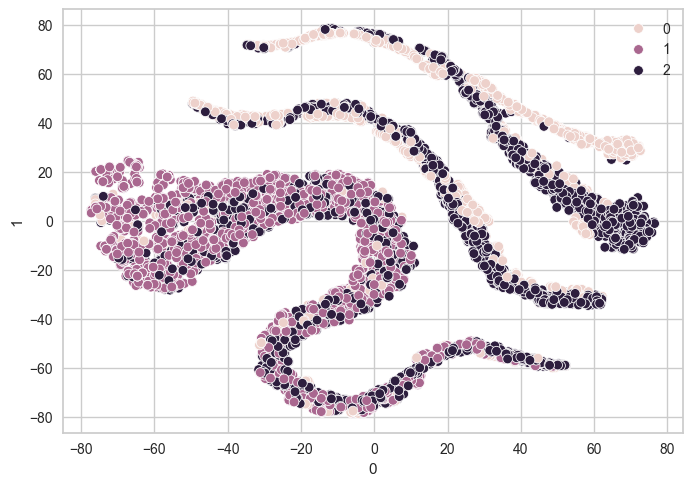

In [334]:
sns.scatterplot(df_tsne, x=0, y=1, hue=labels)

### **Note**
- As I expected **DBSCAN** made the **Best Result**.

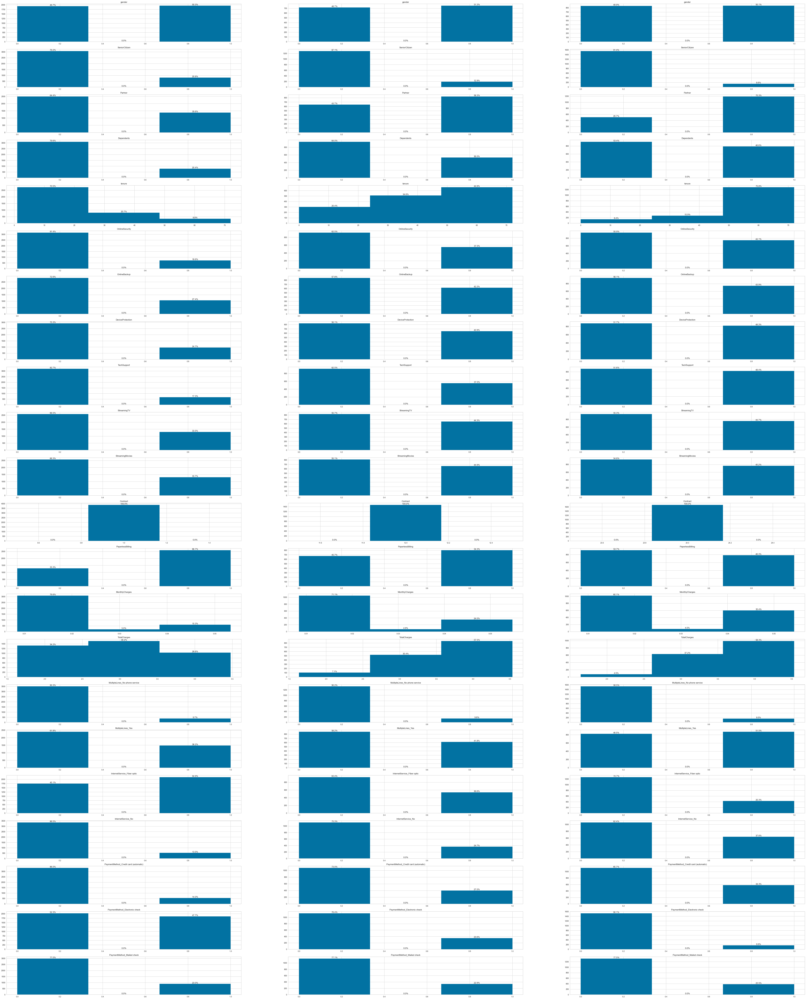

In [336]:
num_features = len(X.columns)
fig, ax = plt.subplots(num_features, 3, figsize=(80, 100))

for column in X.columns:    
    feature_index = X.columns.get_loc(column)
    
    for label in range(3):    
        ax[feature_index, label].hist(df_reciprocal[column][np.where(dbscan.labels_ == label)[0]], bins=3)
        
        counts, bins = np.histogram(df_reciprocal[column][np.where(dbscan.labels_ == label)[0]], bins=3)
        percentages = [(count / len(df_reciprocal[column][np.where(dbscan.labels_ == label)[0]])) * 100 for count in counts]

        for i in range(len(bins) - 1):
            bin_center = (bins[i] + bins[i + 1]) / 2
            ax[feature_index, label].text(bin_center, counts[i], f'{percentages[i]:.1f}%', ha='center', va='bottom')

        ax[feature_index, label].title.set_text(column)

### **Our Insights**

**First Cluster**
- First Cluster includes customers with **lowest tenure** (only **8%** of customers in this cluster spent (50 : 70) months with the Telecom Company).
- First Cluster includes customers with **month-to-month contract**.
- First Cluster use the services rarely, almost non-existent.
- First Cluster has a high percentage of customers that use paperless billing.
- First Cluster includes customers with low amount charged monthly.
- First Cluster doesn't (lowest) use multiple lines.
- First Cluster includes customers with lowest percentage of partners and dependents
- First Cluster uses highly the fiber optic internet service.
- First Cluster use electronic check more.

**Second Cluster**
- Second Cluster includes customers with **moderate tenure** (**45%** of customers in this cluster spent (50 : 70) months with the Telecom Company).
- Second Cluster include customers with **1-year contract**.
- Second Cluster uses the services more than first cluster.
- Second Cluster has a low percentage of customers that use paperless billing.
- Second Cluster includes customers with moderate amount charged monthly.
- Second Cluster uses (moderate) use multiple lines.
- Second Cluster includes customers with more higher percentage of partners and dependents

**Third Cluster**
- Third Cluster includes customers with **highest tenure** (**75%** of customers in this cluster spent (50 : 70) months with the Telecom Company).
- Third Cluster includes customers with **2-year contract**.
- Third Cluster customers use all services provided by telecom company.
- Third Cluster has a low percentage of customers that use paperless billing.
- Third Cluster includes customers with high amount charged monthly.
- Third Cluster uses (highest) multiple lines.
- Third Cluster includes a higher percentege of customers that don't use internet service compared to other clusters.
- Third Cluster use automatic check in payment more.
- Third Cluster includes customers with more higher percentage of partners and dependents.

### **From Previous Insights**
- It's expected that the **First Cluster** is more likely to **Churn** Because it:
    - has a low tenure.
    - doesn't charge monthly with high amounts.
    - adopts month-to-month contract.
    - charges monthly with a low amount and doesn't multiple lines that it means they are't satisfied, trusted or cared about the provided telecom service.
    - doesn't uses company services that it means they aren't engaged and comfortable with using the telecom company services or system.

### **Conclusion**

- I think The two clustering approaches (2 OR 3 Clusters) are valid and can be used by the business, But It's up to business if it prefers to deal with three clusters or deal with two.
- But in my opinion, I prefered more the 3 clusters, Because I think It clearly distinguished between customers.
- So I will adopt the second approach to provide novel insights.

### **Novel Insights**

##### **First Cluster: High Churn Risk**

   - **Key Characteristics:**
      - Lowest tenure, month-to-month contract, low service usage, low monthly charges, high usage of fiber optic internet, electronic check payment.

   - **Retention Strategies:**
      1. **Incentivize Contract Upgrade:**
         - Offer discounts or promotions to switch from month-to-month contracts to longer-term (e.g., 1-year) contracts. This could reduce churn by locking in customers for a longer period.
      2. **Usage Encouragement:**
         - Promote service packages that encourage engagement. You could offer limited-time free trials for premium services or special bundle offers.
      3. **Enhanced Customer Support:**
         - Provide dedicated customer service to assist customers in maximizing the value of their telecom services, helping to foster trust and engagement.
      4. **Rewards for Tenure:**
         - Offer loyalty programs that reward customers for staying with the company longer. For example, provide discounts on monthly charges or free services after 6 or 12 months.

   - **Upselling Opportunities:**
      1. **Service Bundling:**
         - Upsell services they are not currently using, such as adding multiple lines, digital subscriptions, or cloud services, by offering bundle discounts.
      2. **Upgrade Internet Packages:**
         - Since they use fiber optic internet, offer higher-speed plans with attractive discounts or additional features (e.g., priority customer service).
         

##### **Second Cluster: Moderate Tenure**

   - **Key Characteristics:**
      - Moderate tenure, 1-year contract, moderate service usage, low paperless billing usage, moderate monthly charges, moderate use of multiple lines, higher percentage of partners and dependents.

   - **Retention Strategies:**
      1. **Contract Extension Offers:**
         - Incentivize contract renewals by offering benefits for moving to a 2-year contract (e.g., price locks or free upgrades).
      2. **Family Plans & Group Discounts:**
         - Leverage the higher percentage of partners and dependents by offering family plans or discounts on adding more lines.
      3. **Paperless Billing Adoption:**
         - Encourage paperless billing by offering a small monthly discount for switching to this option, improving customer satisfaction while reducing operational costs.

   - **Upselling Opportunities:**
      1. **Service Usage Packages:**
         - Offer upselling opportunities for services they use moderately, such as data plans, entertainment bundles, or more comprehensive family packages.
      2. **Additional Lines and Features:**
         - Since they moderately use multiple lines, offer promotions for adding more lines or premium features (e.g., international calling, home security services).


##### **Third Cluster: High Loyalty**

   - **Key Characteristics:**
      - Highest tenure, 2-year contract, high service usage, low paperless billing, high monthly charges, high usage of multiple lines, higher percentage of customers without internet service, use of automatic check payment.

   - **Retention Strategies:**
      1. **Loyalty Programs:**
         - Reward these long-term customers with exclusive benefits, such as free upgrades, priority customer service, or discounts on premium services.
      2. **Paperless Billing Incentives:**
         - Similar to the second cluster, encourage the adoption of paperless billing through financial incentives, adding to customer convenience.
      3. **Customized Offers:**
         - Personalize offers based on their service usage to make them feel valued. For example, offer tailored packages for specific services they use most (e.g., TV bundles or home phone features).

   - **Upselling Opportunities:**
      1. **Cross-Sell Internet Services:**
         - Since a higher percentage of this cluster doesn't use internet services, offer attractive promotions or incentives to get them onboard with internet services.
      2. **Premium Plans:**
         - Given their willingness to pay higher amounts monthly, you can upsell premium services such as higher-tier internet speeds, enhanced security services, or entertainment packages.

I think these strategies can help reduce churn in the at-risk group, increase customer satisfaction in all groups, and open up new upselling opportunities for revenue growth.